## Internshala Machine Learning with Python Project (Interview Preparation Final Project)
* Mansi Garg
* Data Science PGC
* gargmansi1712@gmail.com

## Views about the problem statement
### Company Background
"The Daily Buzz," a small newspaper in Sydney, was founded by journalists and entrepreneurs passionate about accurate, trustworthy news. Despite initial challenges, it gained a reputation for high-quality journalism and eventually became one of Sydney's most respected news sources. To attract more readers and stay ahead of the competition, the editor-in-chief launched "The Weather Oracle," a new column featuring weather predictions. The column's detailed forecasts, created by experienced meteorologists using advanced technology, received a positive response from the community. To further improve accuracy, the editor decided to hire a machine learning expert to develop a rainfall prediction model.
### Problem Statement
* To create machine learning logistic regression model to predict that whether it is going to rain tommorrow or not.
* Dataset has been provided to us and we have to preprocess that is clean the data by treating the missing values and outlier and removing the unnecessary data.
* After cleaning the data, apply decision tree classification, followed by Bagging and Boosting techniques, as well as the Random Forest Classifier. Then, calculate the accuracy score for each model and create a confusion matrix to assess their performance.
* Suggest the best possible logistic model.

## Solution Approach: Steps towards builiding Rainfall Prediction Model
### Data Loading and Preprocessing:
* Load the data.
* Perform data preprocessing and cleaning like treating mssing values and outliers.
### Model Training and Comparison:
* Performing train_test_split on dataset with test_size of 0.2 and standardizing the train and test data.
* Train various classification models including Logistic Regression, Decision Trees, Bagging, Boosting, and Random Forest Classifier etc.
* Compare the accuracy of each model.
### Model Evaluation:
* Calculate the accuracy score, precision score, recall score, roc_auc score of each model.
* Create a confusion matrix to evaluate the performance.
### Best Model Selection and Improvement:
* Identify the best-performing model.
* Explain why this model performed better than others.
* Suggest ways to further improve the accuracy of the selected model.

## Available ML Models to perform the task
* Logistic Regression
* Linear Disciminant Model
* K-Nearest Neighbors
* Decision Tree Classifier
* Bagging Classification 
* Random Forest Classifier
* Gradient Boosting
* ADA Boosting Classifier
* XGBoost Classification

In [1]:
# Importing required libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
# Loading dataset
df = pd.read_csv('D:/Internshala/Python/sydney_rain prediction.csv', header = 0)

In [4]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,01-02-2008,Sydney,19.5,22.4,15.6,6.2,0.0,92.0,84.0,1017.6,1017.4,8.0,8.0,20.7,20.9,Yes,Yes
1,02-02-2008,Sydney,19.5,25.6,6.0,3.4,2.7,83.0,73.0,1017.9,1016.4,7.0,7.0,22.4,24.8,Yes,Yes
2,03-02-2008,Sydney,21.6,24.5,6.6,2.4,0.1,88.0,86.0,1016.7,1015.6,7.0,8.0,23.5,23.0,Yes,Yes
3,04-02-2008,Sydney,20.2,22.8,18.8,2.2,0.0,83.0,90.0,1014.2,1011.8,8.0,8.0,21.4,20.9,Yes,Yes
4,05-02-2008,Sydney,19.7,25.7,77.4,NaN,0.0,88.0,74.0,1008.3,1004.8,8.0,8.0,22.5,25.5,Yes,Yes


In [5]:
df.replace('Yes', 1, inplace=True)

In [6]:
df.replace('No', 0, inplace= True)

In [7]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,01-02-2008,Sydney,19.5,22.4,15.6,6.2,0.0,92.0,84.0,1017.6,1017.4,8.0,8.0,20.7,20.9,1.0,1
1,02-02-2008,Sydney,19.5,25.6,6.0,3.4,2.7,83.0,73.0,1017.9,1016.4,7.0,7.0,22.4,24.8,1.0,1
2,03-02-2008,Sydney,21.6,24.5,6.6,2.4,0.1,88.0,86.0,1016.7,1015.6,7.0,8.0,23.5,23.0,1.0,1
3,04-02-2008,Sydney,20.2,22.8,18.8,2.2,0.0,83.0,90.0,1014.2,1011.8,8.0,8.0,21.4,20.9,1.0,1
4,05-02-2008,Sydney,19.7,25.7,77.4,NaN,0.0,88.0,74.0,1008.3,1004.8,8.0,8.0,22.5,25.5,1.0,1


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3337 entries, 0 to 3336
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          3337 non-null   object 
 1   Location      3337 non-null   object 
 2   MinTemp       3334 non-null   float64
 3   MaxTemp       3335 non-null   float64
 4   Rainfall      3331 non-null   float64
 5   Evaporation   3286 non-null   float64
 6   Sunshine      3321 non-null   float64
 7   Humidity9am   3323 non-null   float64
 8   Humidity3pm   3324 non-null   float64
 9   Pressure9am   3317 non-null   float64
 10  Pressure3pm   3318 non-null   float64
 11  Cloud9am      2771 non-null   float64
 12  Cloud3pm      2776 non-null   float64
 13  Temp9am       3333 non-null   float64
 14  Temp3pm       3333 non-null   float64
 15  RainToday     3331 non-null   float64
 16  RainTomorrow  3337 non-null   int64  
dtypes: float64(14), int64(1), object(2)
memory usage: 443.3+ KB


In [9]:
# Replacing the null values of data with the respective mean of their variable
df['MinTemp'] = df['MinTemp'].fillna(df['MinTemp'].mean())

In [10]:
df['MaxTemp'] = df['MaxTemp'].fillna(df['MaxTemp'].mean())

In [11]:
df['Rainfall'] = df['Rainfall'].fillna(df['Rainfall'].mean())

In [12]:
df['Evaporation'] = df['Evaporation'].fillna(df['Evaporation'].mean())

In [13]:
df['Sunshine'] = df['Sunshine'].fillna(df['Sunshine'].mean())

In [14]:
df['Humidity9am'] = df['Humidity9am'].fillna(df['Humidity9am'].mean())

In [15]:
df['Humidity3pm'] = df['Humidity3pm'].fillna(df['Humidity3pm'].mean())

In [16]:
df['Pressure9am'] = df['Pressure9am'].fillna(df['Pressure9am'].mean())

In [17]:
df['Pressure3pm'] = df['Pressure3pm'].fillna(df['Pressure3pm'].mean())

In [18]:
df['Cloud9am'] = df['Cloud9am'].fillna(df['Cloud9am'].mean())

In [19]:
df['Cloud3pm'] = df['Cloud3pm'].fillna(df['Cloud3pm'].mean())

In [20]:
df['Temp9am'] = df['Temp9am'].fillna(df['Temp9am'].mean())

In [21]:
df['Temp3pm'] = df['Temp3pm'].fillna(df['Temp3pm'].mean())

In [22]:
df['RainToday'] = df['RainToday'].fillna(df['RainToday'].mean())

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3337 entries, 0 to 3336
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          3337 non-null   object 
 1   Location      3337 non-null   object 
 2   MinTemp       3337 non-null   float64
 3   MaxTemp       3337 non-null   float64
 4   Rainfall      3337 non-null   float64
 5   Evaporation   3337 non-null   float64
 6   Sunshine      3337 non-null   float64
 7   Humidity9am   3337 non-null   float64
 8   Humidity3pm   3337 non-null   float64
 9   Pressure9am   3337 non-null   float64
 10  Pressure3pm   3337 non-null   float64
 11  Cloud9am      3337 non-null   float64
 12  Cloud3pm      3337 non-null   float64
 13  Temp9am       3337 non-null   float64
 14  Temp3pm       3337 non-null   float64
 15  RainToday     3337 non-null   float64
 16  RainTomorrow  3337 non-null   int64  
dtypes: float64(14), int64(1), object(2)
memory usage: 443.3+ KB


In [24]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,01-02-2008,Sydney,19.5,22.4,15.6,6.200000,0.0,92.0,84.0,1017.6,1017.4,8.0,8.0,20.7,20.9,1.0,1
1,02-02-2008,Sydney,19.5,25.6,6.0,3.400000,2.7,83.0,73.0,1017.9,1016.4,7.0,7.0,22.4,24.8,1.0,1
2,03-02-2008,Sydney,21.6,24.5,6.6,2.400000,0.1,88.0,86.0,1016.7,1015.6,7.0,8.0,23.5,23.0,1.0,1
3,04-02-2008,Sydney,20.2,22.8,18.8,2.200000,0.0,83.0,90.0,1014.2,1011.8,8.0,8.0,21.4,20.9,1.0,1
4,05-02-2008,Sydney,19.7,25.7,77.4,5.187432,0.0,88.0,74.0,1008.3,1004.8,8.0,8.0,22.5,25.5,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3332,21-06-2017,Sydney,8.6,19.6,0.0,2.000000,7.8,73.0,52.0,1025.9,1025.3,2.0,2.0,10.5,17.9,0.0,0
3333,22-06-2017,Sydney,9.3,19.2,0.0,2.000000,9.2,78.0,53.0,1028.5,1024.6,2.0,2.0,11.0,18.7,0.0,0
3334,23-06-2017,Sydney,9.4,17.7,0.0,2.400000,2.7,85.0,56.0,1020.8,1015.0,6.0,6.0,10.2,17.3,0.0,0
3335,24-06-2017,Sydney,10.1,19.3,0.0,1.400000,9.3,56.0,35.0,1017.3,1015.1,5.0,2.0,12.4,19.0,0.0,0


In [25]:
# Removing unecessary columns
del df['Date']

In [26]:
del df['Location']

In [27]:
# Understanding the correlation of dependent and independent variables.
df_corr = df.corr()

In [28]:
df_corr

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
MinTemp,1.000000,0.770701,0.012866,0.567623,-0.062959,0.052362,0.270944,-0.393024,-0.355764,0.236288,0.163519,0.938814,0.752410,0.018884,0.079962
MaxTemp,0.770701,1.000000,-0.139837,0.509060,0.325107,-0.186875,-0.152310,-0.388533,-0.424653,-0.087381,-0.099167,0.858986,0.960026,-0.187694,-0.149269
Rainfall,0.012866,-0.139837,1.000000,-0.100468,-0.306119,0.330469,0.301337,-0.036988,0.003210,0.242049,0.200732,-0.055974,-0.143491,0.555191,0.293808
Evaporation,0.567623,0.509060,-0.100468,1.000000,0.174467,-0.394166,-0.101849,-0.345700,-0.300285,-0.037598,-0.037739,0.605348,0.473879,-0.228432,-0.064301
Sunshine,-0.062959,0.325107,-0.306119,0.174467,1.000000,-0.489019,-0.582792,-0.046391,-0.094322,-0.660555,-0.676397,0.114663,0.343563,-0.366306,-0.521637
Humidity9am,0.052362,-0.186875,0.330469,-0.394166,-0.489019,1.000000,0.658120,0.263146,0.251304,0.423560,0.331734,-0.147977,-0.157149,0.399662,0.329011
Humidity3pm,0.270944,-0.152310,0.301337,-0.101849,-0.582792,0.658120,1.000000,0.154352,0.183056,0.453697,0.471684,0.128479,-0.213727,0.342386,0.471250
Pressure9am,-0.393024,-0.388533,-0.036988,-0.345700,-0.046391,0.263146,0.154352,1.000000,0.960460,-0.011072,-0.040115,-0.418943,-0.345926,-0.000356,-0.032465
Pressure3pm,-0.355764,-0.424653,0.003210,-0.300285,-0.094322,0.251304,0.183056,0.960460,1.000000,0.018972,-0.002903,-0.404472,-0.392218,0.056745,0.010977
Cloud9am,0.236288,-0.087381,0.242049,-0.037598,-0.660555,0.423560,0.453697,-0.011072,0.018972,1.000000,0.608995,0.088428,-0.089334,0.316351,0.329525


<Axes: >

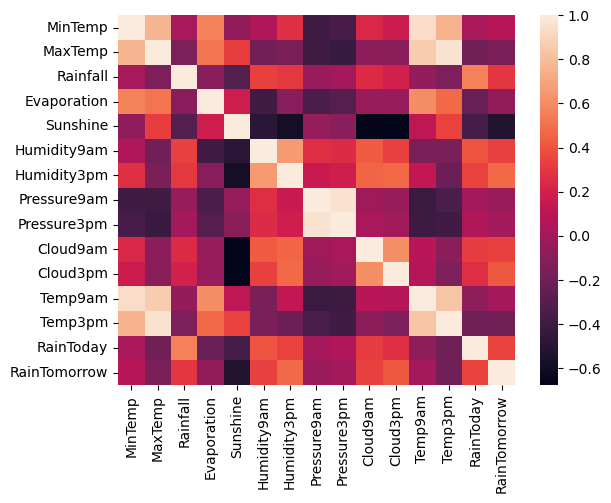

In [29]:
sns.heatmap(data = df_corr)

In [30]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
count,3337.000000,3337.000000,3337.000000,3337.000000,3337.000000,3337.000000,3337.000000,3337.000000,3337.000000,3337.000000,3337.000000,3337.000000,3337.000000,3337.000000,3337.000000
mean,14.865057,23.002339,3.330231,5.187432,7.179374,68.229010,54.699158,1018.346156,1016.018774,4.181523,4.218660,17.819742,21.533333,0.259982,0.259215
std,4.551593,4.493290,9.886270,2.756095,3.801737,15.053668,16.261752,7.000492,7.012157,2.505491,2.409531,4.894240,4.301156,0.438296,0.438269
min,4.300000,11.700000,0.000000,0.000000,0.000000,19.000000,10.000000,986.700000,989.800000,0.000000,0.000000,6.400000,10.200000,0.000000,0.000000
25%,11.000000,19.600000,0.000000,3.200000,4.300000,58.000000,44.000000,1013.800000,1011.300000,2.000000,2.000000,13.800000,18.400000,0.000000,0.000000
50%,14.900000,22.800000,0.000000,4.800000,8.200000,69.000000,56.000000,1018.500000,1016.300000,4.181523,4.218660,18.200000,21.300000,0.000000,0.000000
75%,18.700000,26.000000,1.400000,7.000000,10.200000,80.000000,64.000000,1023.100000,1020.800000,7.000000,7.000000,21.700000,24.500000,1.000000,1.000000
max,27.600000,45.800000,119.400000,18.400000,13.600000,100.000000,99.000000,1039.000000,1036.700000,9.000000,8.000000,36.500000,44.700000,1.000000,1.000000


<Axes: >

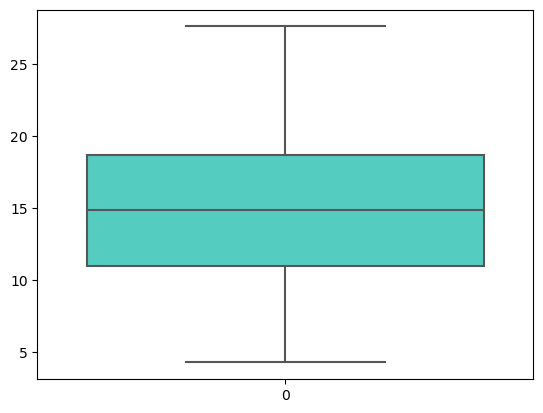

In [31]:
# To see the outliers
sns.boxplot(df['MinTemp'], color = 'turquoise')

<Axes: >

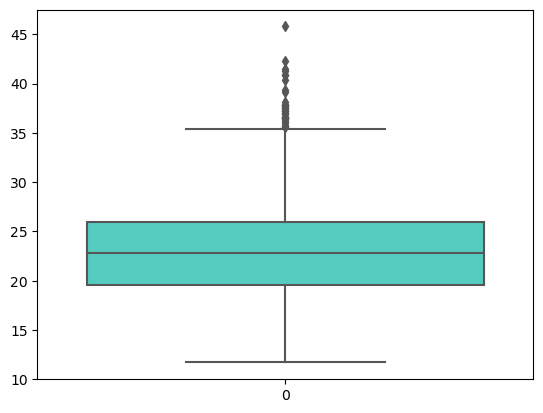

In [32]:
sns.boxplot(df['MaxTemp'], color = 'turquoise')

<Axes: >

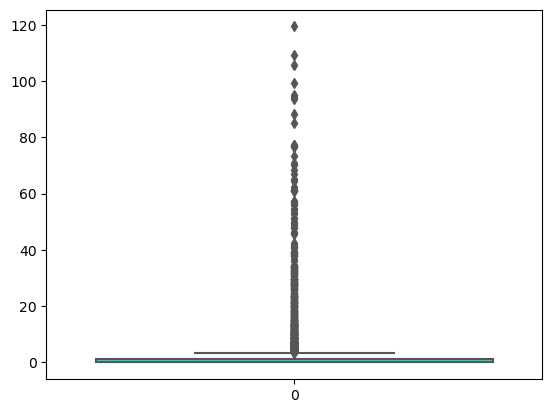

In [33]:
sns.boxplot(df['Rainfall'], color = 'turquoise')

* Outliers found in rainfall attritube needs to treated to get fair results when modeliing of data is done.

In [34]:
ul = np.percentile(df.Rainfall, [99])[0]

In [35]:
ul

52.29599999999982

In [36]:
df[(df.Rainfall > ul)]

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
4,19.7,25.7,77.4,5.187432,0.000000,88.0,74.0,1008.3,1004.8,8.000000,8.00000,22.5,25.5,1.0,1
218,11.8,14.2,62.2,5.187432,0.000000,92.0,88.0,1014.8,1013.1,8.000000,8.00000,13.0,12.3,1.0,1
633,14.4,17.0,73.2,5.187432,0.000000,91.0,60.0,1023.7,1025.3,8.000000,8.00000,14.7,16.6,1.0,1
737,20.2,25.0,77.4,7.400000,0.200000,95.0,86.0,1021.6,1020.8,7.000000,8.00000,21.1,23.8,1.0,1
743,21.4,25.5,70.0,9.400000,0.300000,92.0,80.0,1011.9,1010.2,8.000000,8.00000,22.1,25.2,1.0,1
855,12.5,20.5,61.4,1.000000,4.400000,80.0,67.0,1014.2,1012.0,5.000000,7.00000,13.5,17.4,1.0,0
1140,18.8,23.5,99.4,5.187432,3.300000,92.0,81.0,1012.4,1010.1,4.181523,4.21866,19.4,22.2,1.0,1
1182,13.9,19.9,65.2,5.187432,0.700000,81.0,62.0,1019.5,1019.3,4.181523,4.21866,17.9,19.6,1.0,1
1232,8.7,18.5,76.8,5.187432,1.600000,91.0,83.0,1012.7,1013.5,4.181523,4.21866,14.3,15.0,1.0,1
1234,11.3,13.9,88.2,5.187432,0.000000,88.0,95.0,1018.3,1018.0,4.181523,4.21866,13.1,11.5,1.0,1


In [37]:
df.Rainfall[(df.Rainfall > 3*ul)] = 3*ul

In [38]:
df.Rainfall[(df.Rainfall > 3*ul)]

Series([], Name: Rainfall, dtype: float64)

In [39]:
# Understanding relationship between different independent variables with dependent variable in graphical view.

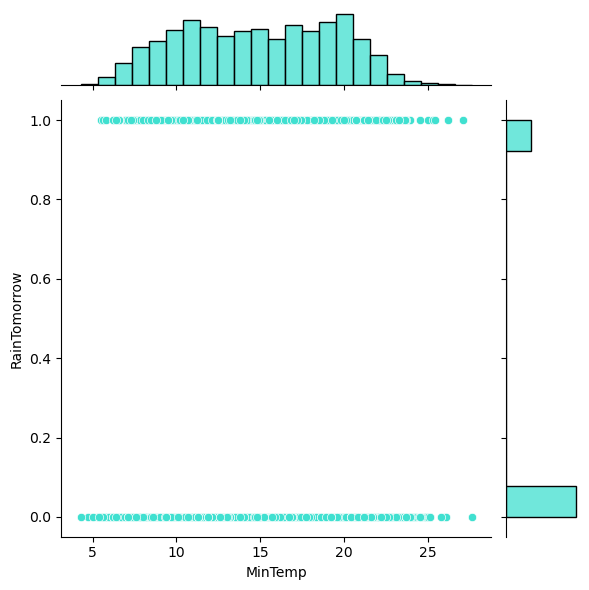

In [40]:
sns.jointplot(x = 'MinTemp', y = 'RainTomorrow', data = df, color = 'turquoise')

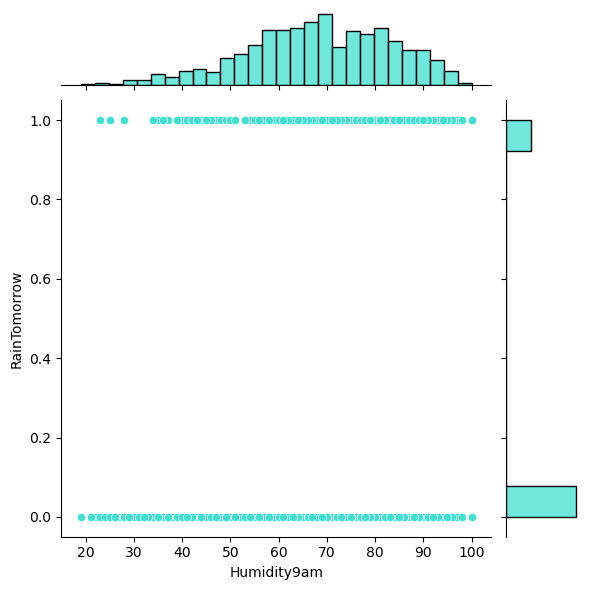

In [41]:
sns.jointplot(x = 'Humidity9am', y = 'RainTomorrow', data = df, color = 'turquoise')

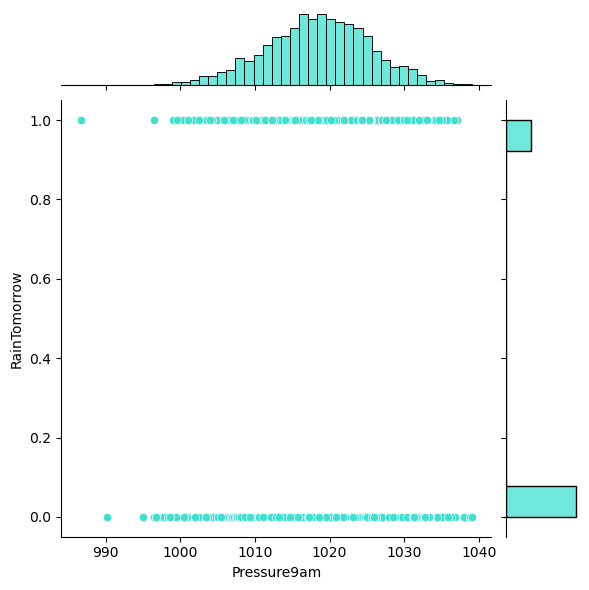

In [42]:
sns.jointplot(x = 'Pressure9am', y = 'RainTomorrow', data = df, color = 'turquoise')

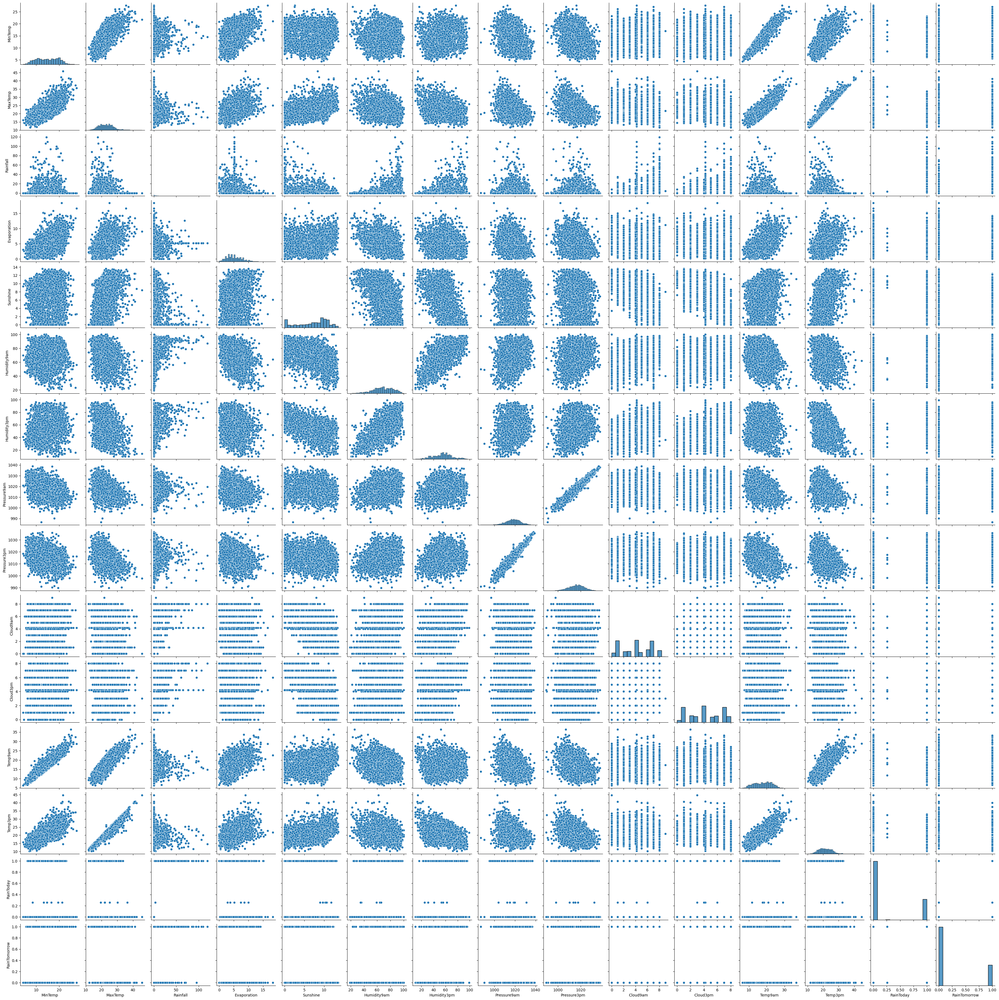

In [43]:
sns.pairplot(df)

### Creating dependent and independent variables

In [44]:
x_multi = df.drop('RainTomorrow', axis= 1)

In [45]:
y_multi = df['RainTomorrow']

### Performing Train_Test_Split with test_size = 0.2

In [46]:
# Importing train_test_split
from sklearn.model_selection import train_test_split

In [47]:
x_train, x_test, y_train, y_test = train_test_split(x_multi, y_multi, test_size = 0.2, random_state = 42)

### Performing Standard Scaling on created variables

In [48]:
# Importing necessary library
from sklearn import preprocessing

In [49]:
scaler = preprocessing.StandardScaler().fit(x_train)

In [50]:
x_train_s = scaler.transform(x_train)

In [51]:
scaler = preprocessing.StandardScaler().fit(x_test)

In [52]:
x_test_s = scaler.transform(x_test)

### Logistic Regression 

In [53]:
# Importing Necessary Library
from sklearn.linear_model import LogisticRegression

In [54]:
df_lr = LogisticRegression()

In [55]:
df_lr.fit(x_train_s, y_train)

LogisticRegression()

In [56]:
y_train_pred = df_lr.predict(x_train_s)

In [57]:
y_test_pred = df_lr.predict(x_test_s)

* Evaluating Model Performance

In [58]:
# Importing necessary libraries
from sklearn.metrics import confusion_matrix, precision_score, recall_score, accuracy_score, roc_auc_score

In [59]:
print('confusion_matrix:', confusion_matrix(y_test, y_test_pred))
print('precision_score:', precision_score(y_test, y_test_pred))
print('recall_score:', recall_score(y_test, y_test_pred))
print('accuracy_score:', accuracy_score(y_test, y_test_pred))
print('roc_auc_score:', roc_auc_score(y_test, y_test_pred))

confusion_matrix: [[453  31]
 [ 87  97]]
precision_score: 0.7578125
recall_score: 0.5271739130434783
accuracy_score: 0.8233532934131736
roc_auc_score: 0.7315621631333094


* Plotting confusion_matrix, precision_recall_curve and roc_curve

In [60]:
cm = confusion_matrix(y_test, y_test_pred)

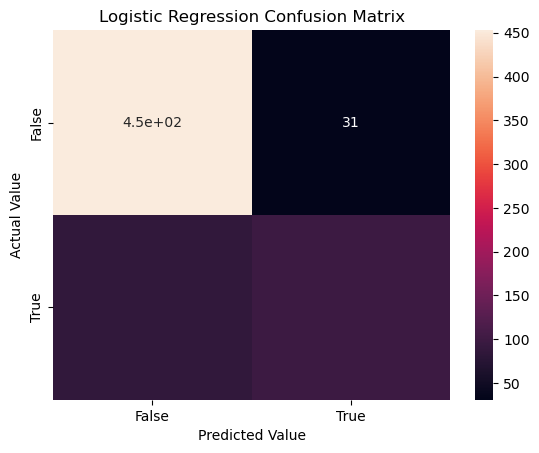

In [61]:
sns.heatmap(cm, color = 'Pink', annot=True, xticklabels = [False, True], yticklabels = [False, True])
plt.xlabel('Predicted Value')
plt.ylabel('Actual Value')
plt.title('Logistic Regression Confusion Matrix')
plt.show()

In [62]:
# Importing required libraries
from sklearn import metrics
from sklearn.metrics import precision_recall_curve, roc_curve, auc

In [63]:
precision, recall, _ = precision_recall_curve(y_test, y_test_pred)

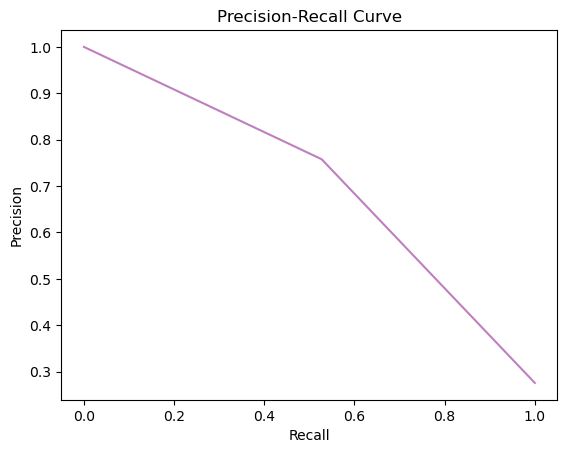

In [64]:
plt.plot(recall, precision, color='Purple', alpha=0.5)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

In [65]:
fpr, tpr, threshold = roc_curve(y_test, y_test_pred)

In [66]:
auc_roc = auc(fpr,tpr)

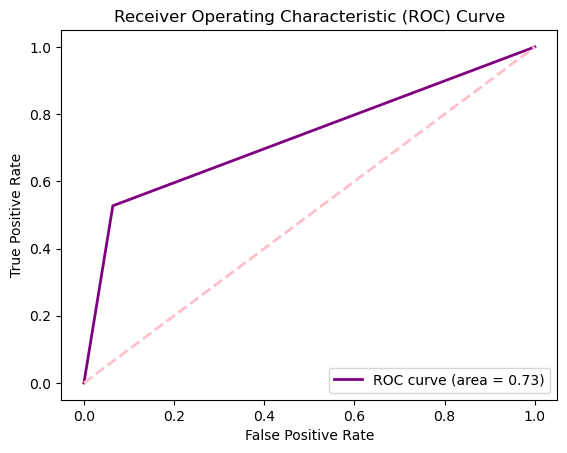

In [67]:
plt.plot(fpr, tpr, color = 'Purple', label = f'ROC curve (area = {auc_roc:.2f})', lw=2)
plt.plot([0,1],[0,1], color = 'Pink', lw = 2, linestyle = '--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

### Linear Discriminant Analysis

In [68]:
# Importing required library
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [69]:
 df_lda = LinearDiscriminantAnalysis()

In [70]:
df_lda.fit(x_train_s, y_train)

LinearDiscriminantAnalysis()

In [71]:
y_train_lda_pred = df_lda.predict(x_train_s)

In [72]:
y_test_lda_pred = df_lda.predict(x_test_s)

* Evaluating Model Performance

In [73]:
print('confusion_matrix:', confusion_matrix(y_test, y_test_lda_pred))
print('precision_score:', precision_score(y_test, y_test_lda_pred))
print('recall_score:', recall_score(y_test, y_test_lda_pred))
print('accuracy_score:', accuracy_score(y_test, y_test_lda_pred))
print('roc_auc_score:', roc_auc_score(y_test, y_test_lda_pred))

confusion_matrix: [[446  38]
 [ 82 102]]
precision_score: 0.7285714285714285
recall_score: 0.5543478260869565
accuracy_score: 0.8203592814371258
roc_auc_score: 0.7379177146963709


* Plotting confusion_matrix, precision_recall_curve and roc_curve

In [74]:
cm1 = confusion_matrix(y_test, y_test_lda_pred)

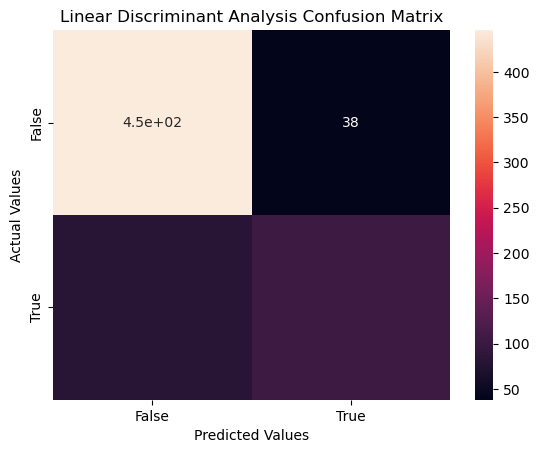

In [75]:
sns.heatmap(cm1, color = 'Purple', annot = True, xticklabels = [False, True], yticklabels = [False, True])
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('Linear Discriminant Analysis Confusion Matrix')
plt.show()

In [76]:
precision1, recall1,_ = precision_recall_curve(y_test, y_test_lda_pred)

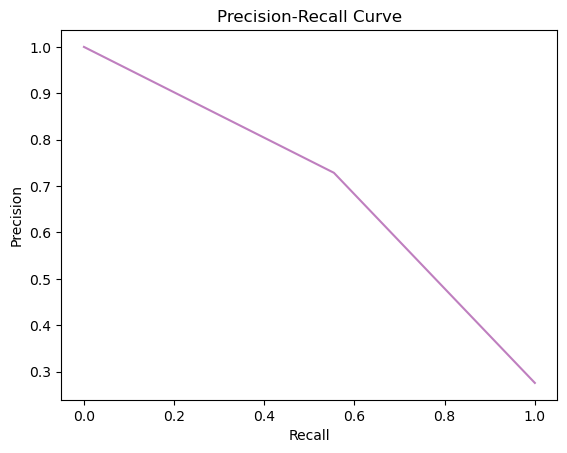

In [77]:
plt.plot(recall1, precision1, color='Purple', alpha=0.5)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

In [78]:
fpr1, tpr1, threshold1 = roc_curve(y_test, y_test_lda_pred)

In [79]:
auc_roc1 = auc(fpr1,tpr1)

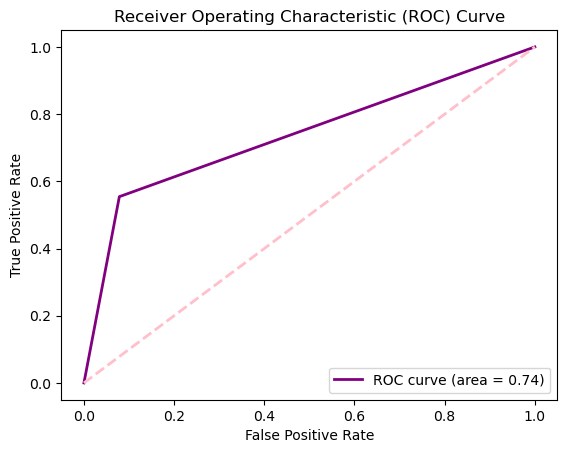

In [80]:
plt.plot(fpr1, tpr1, color = 'Purple', label = f'ROC curve (area = {auc_roc1:.2f})', lw=2)
plt.plot([0,1],[0,1], color = 'Pink', lw = 2, linestyle = '--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

### K- Nearest Neighbors Classifier

In [81]:
# Importing required library
from sklearn.neighbors import KNeighborsClassifier

In [82]:
df_knn = KNeighborsClassifier(n_neighbors = 5)

In [83]:
df_knn.fit(x_train_s, y_train)

KNeighborsClassifier()

In [84]:
y_train_knn_pred = df_knn.predict(x_train_s)

In [85]:
y_test_knn_pred = df_knn.predict(x_test_s)

* Evaluating Model Performance

In [86]:
print('confusion_matrix:', confusion_matrix(y_test, y_test_knn_pred))
print('precision_score:', precision_score(y_test, y_test_knn_pred))
print('recall_score:', recall_score(y_test, y_test_knn_pred))
print('accuracy_score:', accuracy_score(y_test, y_test_knn_pred))
print('roc_auc_score:', roc_auc_score(y_test, y_test_knn_pred))

confusion_matrix: [[437  47]
 [ 92  92]]
precision_score: 0.6618705035971223
recall_score: 0.5
accuracy_score: 0.7919161676646707
roc_auc_score: 0.7014462809917357


### K- Nearest Neighbors Classifier with GridSearchCV

In [87]:
from sklearn.model_selection import GridSearchCV

In [88]:
# Creating a dictionary
params = {'n_neighbors': [1,2,3,4,5,6,7,8,9,10]}

In [89]:
df_knn_gscv = GridSearchCV(KNeighborsClassifier(), params)

In [90]:
df_knn_gscv.fit(x_train_s, y_train)

GridSearchCV(estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]})

In [91]:
df_knn_gscv.best_params_

{'n_neighbors': 9}

In [92]:
df_knn_gscv1 = df_knn_gscv.best_estimator_

In [93]:
df_knn_gscv1

KNeighborsClassifier(n_neighbors=9)

In [94]:
y_train_knngscv_pred = df_knn_gscv1.predict(x_train_s)

In [95]:
y_test_knngscv_pred = df_knn_gscv1.predict(x_test_s)

* Evaluating Model Performance

In [96]:
print('confusion_matrix:', confusion_matrix(y_test, y_test_knngscv_pred))
print('precision_score:', precision_score(y_test, y_test_knngscv_pred))
print('recall_score:', recall_score(y_test, y_test_knngscv_pred))
print('accuracy_score:', accuracy_score(y_test, y_test_knngscv_pred))
print('roc_auc_score:', roc_auc_score(y_test, y_test_knngscv_pred))

confusion_matrix: [[443  41]
 [ 90  94]]
precision_score: 0.6962962962962963
recall_score: 0.5108695652173914
accuracy_score: 0.8038922155688623
roc_auc_score: 0.7130794107078693


* Plotting confusion_matrix, precision_recall_curve, roc_curve

In [97]:
cm2 = confusion_matrix(y_test, y_test_knngscv_pred)

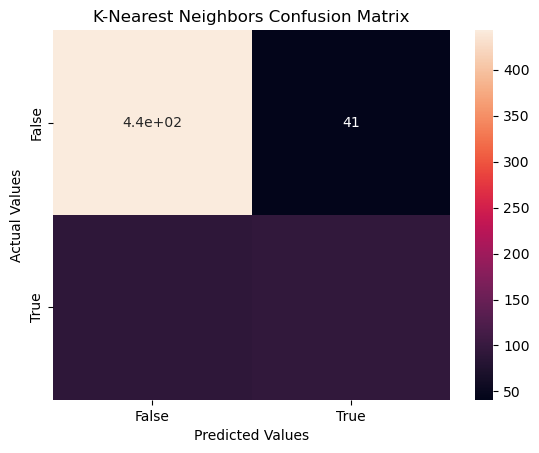

In [98]:
sns.heatmap(cm2, color = 'Purple', annot = True, xticklabels = [False, True], yticklabels = [False, True])
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('K-Nearest Neighbors Confusion Matrix')
plt.show()

In [99]:
precision, recall, _ = precision_recall_curve(y_test, y_test_knngscv_pred)

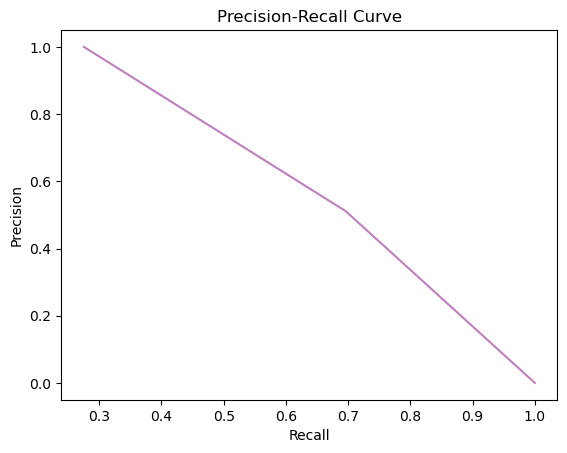

In [100]:
plt.plot(precision, recall, color = 'Purple', alpha = 0.5)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

In [101]:
fpr2, tpr2, threshold2 = roc_curve(y_test, y_test_knngscv_pred)

In [102]:
auc_roc2 = auc(fpr2,tpr2)

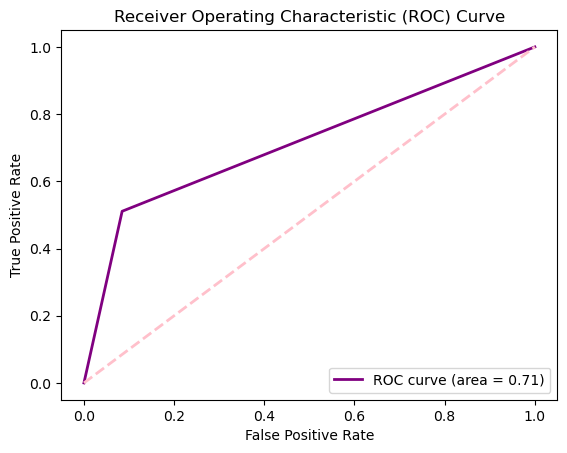

In [103]:
plt.plot(fpr2, tpr2, color = 'Purple', label = f'ROC curve (area = {auc_roc2:.2f})', lw=2)
plt.plot([0,1],[0,1], color = 'Pink', lw = 2, linestyle = '--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

### Decision Tree Classifier

In [104]:
# Importing required library
from sklearn import tree

In [105]:
df_dt = tree.DecisionTreeClassifier()

In [106]:
df_dt.fit(x_train_s, y_train)

DecisionTreeClassifier()

In [107]:
y_train_dt_pred = df_dt.predict(x_train_s)

In [108]:
y_test_dt_pred = df_dt.predict(x_test_s)

* Evaluating Model Perfromance

In [109]:
print('confusion_matrix:', confusion_matrix(y_test, y_test_dt_pred))
print('precision_score:', precision_score(y_test, y_test_dt_pred))
print('recall_score:', recall_score(y_test, y_test_dt_pred))
print('accuracy_score:', accuracy_score(y_test, y_test_dt_pred))
print('roc_auc_score:', roc_auc_score(y_test, y_test_dt_pred))

confusion_matrix: [[399  85]
 [ 74 110]]
precision_score: 0.5641025641025641
recall_score: 0.5978260869565217
accuracy_score: 0.7619760479041916
roc_auc_score: 0.711103126122889


* Plotting Decision Tree

In [110]:
import graphviz
import pydotplus
from IPython.display import Image

In [111]:
dot_data = tree.export_graphviz(df_dt, out_file= None, filled = True, rounded=True, 
                           special_characters=True, feature_names= x_train.columns)

In [112]:
graph = pydotplus.graph_from_dot_data(dot_data)

In [113]:
Image(graph.create_png())

### Decision Tree with depth control

In [114]:
df_dt1 = tree.DecisionTreeClassifier(max_depth = 3)

In [115]:
df_dt1.fit(x_train_s, y_train)

DecisionTreeClassifier(max_depth=3)

In [116]:
y_train_df_dt1_pred = df_dt1.predict(x_train_s)

In [117]:
y_test_df_dt1_pred = df_dt1.predict(x_test_s)

* Evaluating Model Performance

In [118]:
print('confusion_matrix:', confusion_matrix(y_test, y_test_df_dt1_pred))
print('precision_score:', precision_score(y_test, y_test_df_dt1_pred))
print('recall_score:', recall_score(y_test, y_test_df_dt1_pred))
print('accuracy_score:', accuracy_score(y_test, y_test_df_dt1_pred))
print('roc_auc_score:', roc_auc_score(y_test, y_test_df_dt1_pred))

confusion_matrix: [[435  49]
 [ 85  99]]
precision_score: 0.668918918918919
recall_score: 0.5380434782608695
accuracy_score: 0.7994011976047904
roc_auc_score: 0.718401904419691


* Plotting confusion_matrix, precision_recall_curve and roc_curve

In [119]:
cm2 = confusion_matrix(y_test, y_test_df_dt1_pred)

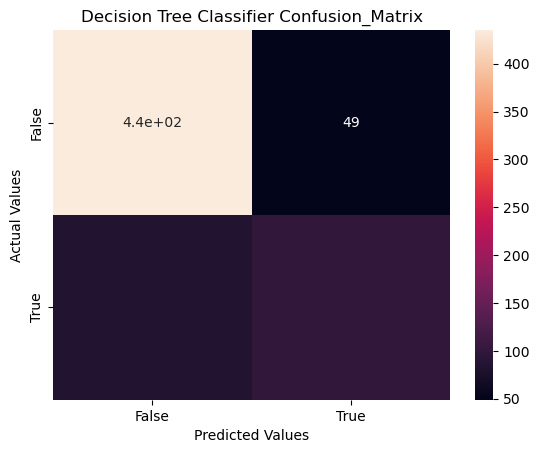

In [120]:
sns.heatmap(cm2, color = 'Purple', annot = True, xticklabels = [False,True], yticklabels = [False, True])
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('Decision Tree Classifier Confusion_Matrix')
plt.show()

In [121]:
precision, recall, _ = precision_recall_curve(y_test, y_test_df_dt1_pred)

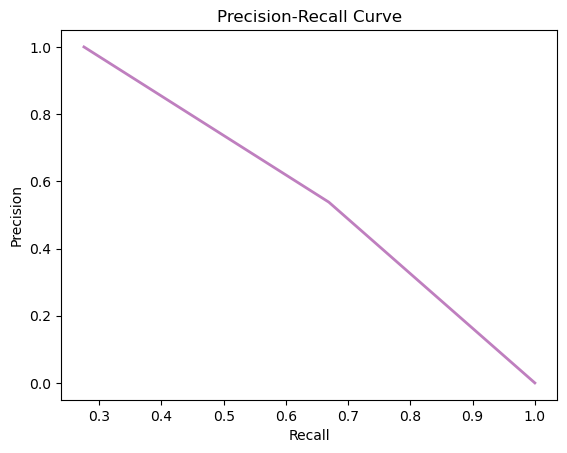

In [122]:
plt.plot(precision, recall, color = 'Purple', lw = 2, alpha =0.5)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

In [123]:
fpr3, tpr3, threshold3 = roc_curve(y_test,y_test_df_dt1_pred)

In [124]:
auc_roc3 = auc(fpr3,tpr3)

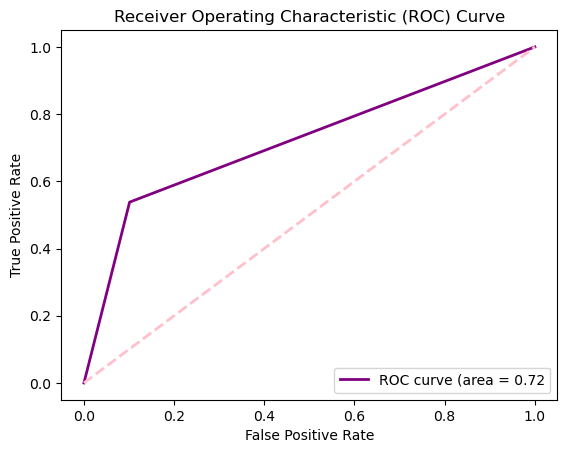

In [125]:
plt.plot(fpr3, tpr3, color = 'Purple', lw=2, label = f'ROC curve (area = {auc_roc3:.2f}')
plt.plot([0,1],[0,1], color = 'Pink', lw = 2, linestyle = '--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

### Bagging Classification

In [126]:
# Importing required library
from sklearn.ensemble import BaggingClassifier

In [127]:
df_tree = tree.DecisionTreeClassifier()

In [128]:
df_bagg = BaggingClassifier(base_estimator = df_tree, n_estimators = 250, bootstrap = True, n_jobs= -1, random_state = 42)

In [129]:
df_bagg.fit(x_train_s, y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=250,
                  n_jobs=-1, random_state=42)

In [130]:
y_train_bagg_pred = df_bagg.predict(x_train_s)

In [131]:
y_test_bagg_pred = df_bagg.predict(x_test_s)

In [132]:
print('confusion_matrix:', confusion_matrix(y_test, y_test_bagg_pred))
print('precision_score:', precision_score(y_test, y_test_bagg_pred))
print('recall_score:', recall_score(y_test, y_test_bagg_pred))
print('accuracy_score:', accuracy_score(y_test, y_test_bagg_pred))
print('roc_auc_score:', roc_auc_score(y_test, y_test_bagg_pred))

confusion_matrix: [[448  36]
 [ 84 100]]
precision_score: 0.7352941176470589
recall_score: 0.5434782608695652
accuracy_score: 0.8203592814371258
roc_auc_score: 0.7345490477901545


### Bagging classification with GridSearchCV

In [133]:
# Creating dictionary
params1 = {'n_estimators': [150,250,350,500],
          'max_features': [4,5,6,7,8,9],
          'max_samples': [3,5,7]}

In [134]:
df_bagg_gscv = GridSearchCV(df_bagg, params1, n_jobs = -1, cv= 5, scoring = 'accuracy')

In [135]:
df_bagg_gscv.fit(x_train_s, y_train)

GridSearchCV(cv=5,
             estimator=BaggingClassifier(base_estimator=DecisionTreeClassifier(),
                                         n_estimators=250, n_jobs=-1,
                                         random_state=42),
             n_jobs=-1,
             param_grid={'max_features': [4, 5, 6, 7, 8, 9],
                         'max_samples': [3, 5, 7],
                         'n_estimators': [150, 250, 350, 500]},
             scoring='accuracy')

In [136]:
df_bagg_gscv.best_params_

{'max_features': 9, 'max_samples': 7, 'n_estimators': 500}

In [137]:
df_bagg_gscv1 = df_bagg_gscv.best_estimator_

In [138]:
y_train_bagg_gscv1_pred  = df_bagg_gscv1.predict(x_train_s)

In [139]:
y_test_bagg_gscv1_pred  = df_bagg_gscv1.predict(x_test_s)

* Evaluating Model Performance

In [140]:
print('confusion_matrix:', confusion_matrix(y_test, y_test_bagg_gscv1_pred))
print('precision_score:', precision_score(y_test, y_test_bagg_gscv1_pred))
print('recall_score:', recall_score(y_test, y_test_bagg_gscv1_pred))
print('accuracy_score:', accuracy_score(y_test, y_test_bagg_gscv1_pred))
print('roc_auc_score:', roc_auc_score(y_test, y_test_bagg_gscv1_pred))

confusion_matrix: [[482   2]
 [150  34]]
precision_score: 0.9444444444444444
recall_score: 0.18478260869565216
accuracy_score: 0.7724550898203593
roc_auc_score: 0.5903251886453467


* Plotting confusion_matrix, precision_recall_curve, roc_curve

In [141]:
cm3 = confusion_matrix(y_test, y_test_bagg_gscv1_pred)

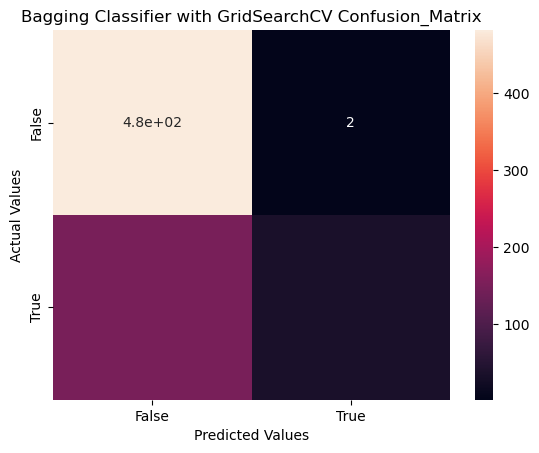

In [142]:
sns.heatmap(cm3, color = 'Purple', annot = True, xticklabels = [False,True], yticklabels = [False, True])
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('Bagging Classifier with GridSearchCV Confusion_Matrix')
plt.show()

In [143]:
precision5, recall5, _ = precision_recall_curve(y_test, y_test_bagg_gscv1_pred)

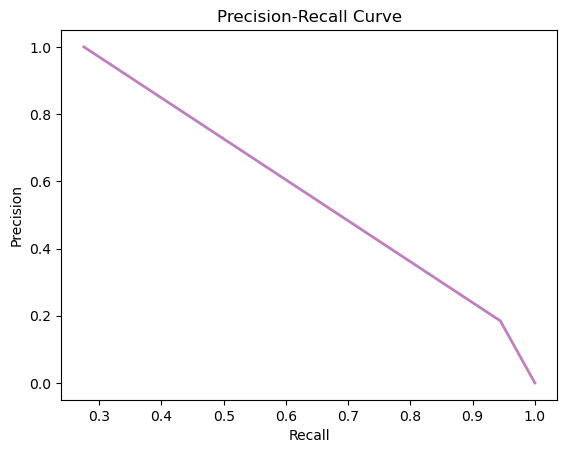

In [144]:
plt.plot(precision5, recall5, color = 'Purple', lw = 2, alpha =0.5)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

In [145]:
fpr5, tpr5, threshold5 = roc_curve(y_test, y_test_bagg_gscv1_pred)

In [146]:
auc_roc5 = auc(fpr5, tpr5)

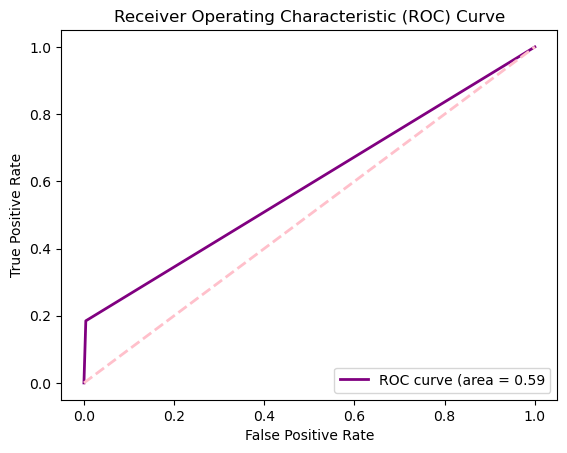

In [147]:
plt.plot(fpr5, tpr5, color = 'Purple', lw=2, label = f'ROC curve (area = {auc_roc5:.2f}')
plt.plot([0,1],[0,1], color = 'Pink', lw = 2, linestyle = '--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

### Random Forest Classifier

In [148]:
# Import required library
from sklearn.ensemble import RandomForestClassifier

In [149]:
df_rfc = RandomForestClassifier(n_estimators = 250, n_jobs = -1, random_state = 42)

In [150]:
df_rfc.fit(x_train_s, y_train)

RandomForestClassifier(n_estimators=250, n_jobs=-1, random_state=42)

In [151]:
y_train_rfc_pred = df_rfc.predict(x_train_s)

In [152]:
y_test_rfc_pred = df_rfc.predict(x_test_s)

* Evaluating Model Performance

In [153]:
print('confusion_matrix:', confusion_matrix(y_test, y_test_rfc_pred))
print('precision_score:', precision_score(y_test, y_test_rfc_pred))
print('recall_score:', recall_score(y_test, y_test_rfc_pred))
print('accuracy_score:', accuracy_score(y_test, y_test_rfc_pred))
print('roc_auc_score:', roc_auc_score(y_test, y_test_rfc_pred))

confusion_matrix: [[451  33]
 [ 86  98]]
precision_score: 0.7480916030534351
recall_score: 0.532608695652174
accuracy_score: 0.8218562874251497
roc_auc_score: 0.732213438735178


### Random Forest Classifier with GridSearchCV

In [154]:
df_rfc1 = RandomForestClassifier(n_estimators = 250, random_state = 42)

In [155]:
params2 = {'min_samples_split': [3,5,7,9],
          'max_features': [4,6,8,10],
          'max_depth': [3,4,5]}

In [156]:
df_rfc_gscv = GridSearchCV(df_rfc1, params2, n_jobs = -1, cv= 5, scoring= 'accuracy')

In [157]:
df_rfc_gscv.fit(x_train_s, y_train)

GridSearchCV(cv=5,
             estimator=RandomForestClassifier(n_estimators=250,
                                              random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [3, 4, 5], 'max_features': [4, 6, 8, 10],
                         'min_samples_split': [3, 5, 7, 9]},
             scoring='accuracy')

In [158]:
df_rfc_gscv.best_params_

{'max_depth': 5, 'max_features': 4, 'min_samples_split': 3}

In [159]:
df_rfc_gscv1 = df_rfc_gscv.best_estimator_

In [160]:
y_train_rfc_gscv1_pred = df_rfc_gscv1.predict(x_train_s)

In [161]:
y_test_rfc_gscv1_pred = df_rfc_gscv1.predict(x_test_s)

* Evaluating Model Performance

In [162]:
print('confusion_matrix:', confusion_matrix(y_test, y_test_rfc_gscv1_pred))
print('precision_score:', precision_score(y_test, y_test_rfc_gscv1_pred))
print('recall_score:', recall_score(y_test, y_test_rfc_gscv1_pred))
print('accuracy_score:', accuracy_score(y_test, y_test_rfc_gscv1_pred))
print('roc_auc_score:', roc_auc_score(y_test, y_test_rfc_gscv1_pred))

confusion_matrix: [[461  23]
 [ 94  90]]
precision_score: 0.7964601769911505
recall_score: 0.4891304347826087
accuracy_score: 0.8248502994011976
roc_auc_score: 0.720804886812792


* Plotting confusion_matrix, precision_recall_curve, roc_curve

In [163]:
cm4 = confusion_matrix(y_test, y_test_rfc_gscv1_pred)

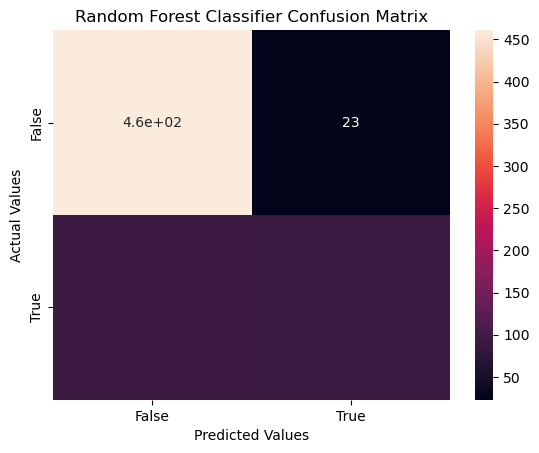

In [164]:
sns.heatmap(cm4, color = 'Purple', annot = True, xticklabels = [False, True], yticklabels = [False, True])
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('Random Forest Classifier Confusion Matrix')
plt.show()

In [165]:
precision6, recall6, _  = precision_recall_curve(y_test, y_test_rfc_gscv1_pred)

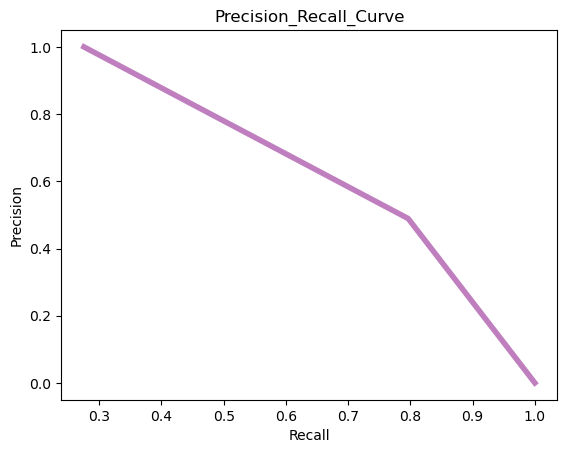

In [166]:
plt.plot(precision6, recall6, color = 'Purple', lw = 4, alpha = 0.5)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision_Recall_Curve')
plt.show()

In [167]:
fpr6, tpr6, threshold6 = roc_curve(y_test, y_test_rfc_gscv1_pred)

In [168]:
auc_roc6 = auc(fpr6, tpr6)

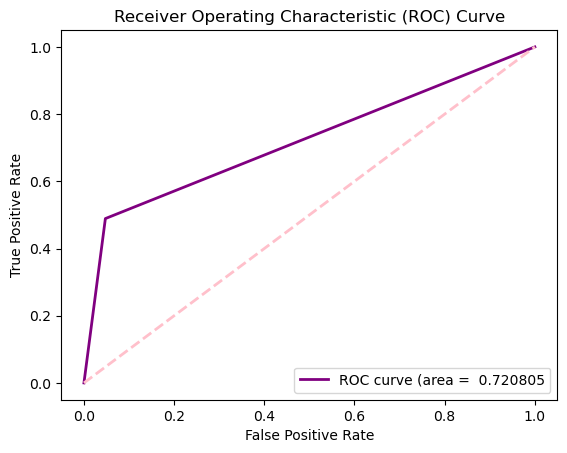

In [169]:
plt.plot(fpr6, tpr6, color = 'Purple', lw = 2, label = f'ROC curve (area = {auc_roc6: 2f}')
plt.plot([0,1],[0,1], color = 'Pink', lw= 2, linestyle = '--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc = 'lower right')
plt.show()       

### Gradient Boosting with GridSearchCV

In [170]:
# Importing required library
from sklearn.ensemble import GradientBoostingClassifier

In [171]:
df_gbc = GradientBoostingClassifier()

In [172]:
params_gbc = {'learning_rate': [0.1,0.2,0.3,0.4],
             'max_depth': [3,4,5,6],
             'n_estimators': [250,500,750]}

In [173]:
df_gbc_cv = GridSearchCV(df_gbc, params_gbc, cv = 5, n_jobs = -1, scoring = 'accuracy')

In [174]:
df_gbc_cv.fit(x_train_s, y_train)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'learning_rate': [0.1, 0.2, 0.3, 0.4],
                         'max_depth': [3, 4, 5, 6],
                         'n_estimators': [250, 500, 750]},
             scoring='accuracy')

In [175]:
df_gbc_cv.best_params_

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 250}

In [176]:
df_gbc_cv1 = df_gbc_cv.best_estimator_

In [177]:
df_gbc_cv1

GradientBoostingClassifier(n_estimators=250)

In [179]:
df_gbc_cv1.fit(x_train_s, y_train)

GradientBoostingClassifier(n_estimators=250)

In [181]:
y_train_gbc_pred = df_gbc_cv1.predict(x_train_s)

In [182]:
y_test_gbc_pred = df_gbc_cv1.predict(x_test_s)

* Evaluating Model Performance

In [183]:
print('confusion_matrix:', confusion_matrix(y_test, y_test_gbc_pred))
print('precision_score:', precision_score(y_test, y_test_gbc_pred))
print('recall_score:', recall_score(y_test, y_test_gbc_pred))
print('accuracy_score:', accuracy_score(y_test, y_test_gbc_pred))
print('roc_auc_score:', roc_auc_score(y_test, y_test_gbc_pred))

confusion_matrix: [[449  35]
 [ 82 102]]
precision_score: 0.7445255474452555
recall_score: 0.5543478260869565
accuracy_score: 0.8248502994011976
roc_auc_score: 0.7410168882500898


* Plotting Confusion_matrix, precision_recall_curve, roc_curve

In [184]:
cm7 = confusion_matrix(y_test, y_test_gbc_pred)

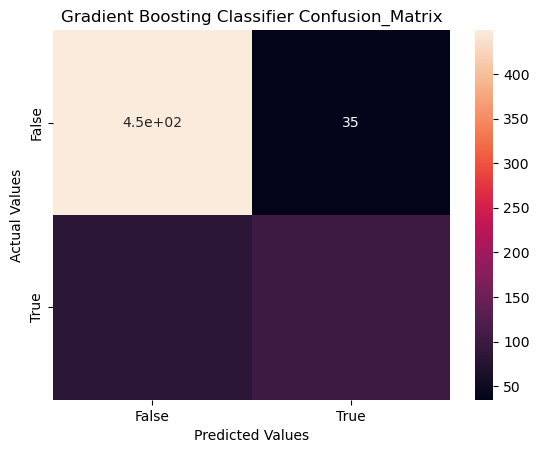

In [186]:
sns.heatmap(cm7, color= 'Purple', annot = True, xticklabels = [False, True], yticklabels = [False, True])
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('Gradient Boosting Classifier Confusion_Matrix')
plt.show()

In [187]:
precision7, recall7, _ = precision_recall_curve(y_test, y_test_gbc_pred)

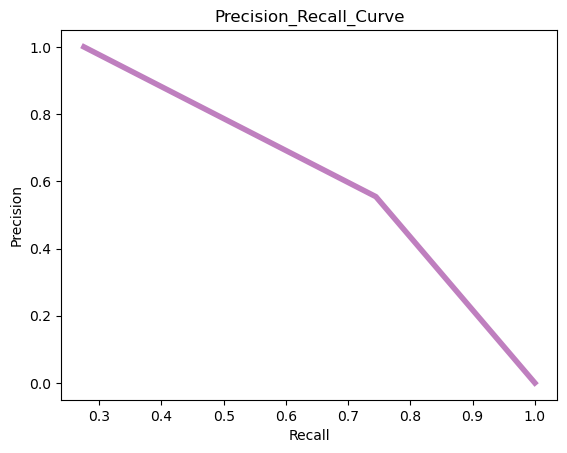

In [189]:
plt.plot(precision7, recall7, lw = 4, color = 'Purple', alpha= 0.5)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision_Recall_Curve')
plt.show()

In [190]:
fpr7, tpr7, threshold7 = roc_curve(y_test, y_test_gbc_pred)

In [191]:
auc_roc7 = auc(fpr7, tpr7)

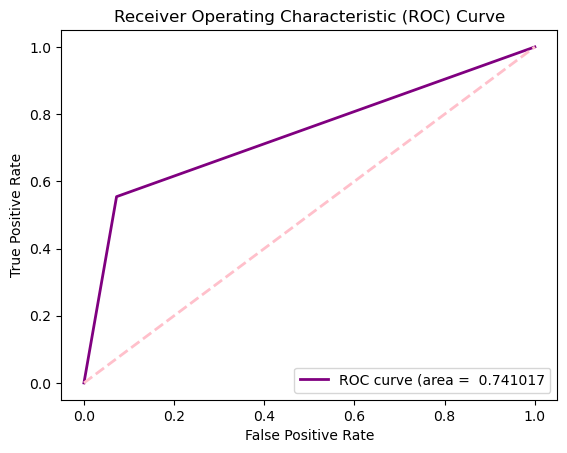

In [192]:
plt.plot(fpr7, tpr7, color = 'Purple', lw = 2, label = f'ROC curve (area = {auc_roc7: 2f}')
plt.plot([0,1],[0,1], color = 'Pink', lw= 2, linestyle = '--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc = 'lower right')
plt.show()

### ADA Boost Classifier with GridSearchCV

In [197]:
# Importing required library
from sklearn.ensemble import AdaBoostClassifier

In [198]:
df_ada = AdaBoostClassifier()

In [222]:
df_ada.fit(x_train_s, y_train)

AdaBoostClassifier()

In [203]:
params_ada = {'learning_rate': [0.1, 0.2, 0.3],
             'n_estimators': [500,700,900]}

In [204]:
df_ada_gscv = GridSearchCV(df_ada, params_ada, cv= 5, n_jobs = -1, scoring = 'accuracy')

In [205]:
df_ada_gscv.fit(x_train_s, y_train)

GridSearchCV(cv=5, estimator=AdaBoostClassifier(), n_jobs=-1,
             param_grid={'learning_rate': [0.1, 0.2, 0.3],
                         'n_estimators': [500, 700, 900]},
             scoring='accuracy')

In [206]:
df_ada_gscv.best_params_

{'learning_rate': 0.1, 'n_estimators': 700}

In [207]:
df_ada_gscv1 = df_ada_gscv.best_estimator_

In [208]:
df_ada_gscv1

AdaBoostClassifier(learning_rate=0.1, n_estimators=700)

In [209]:
y_train_ada_pred = df_ada_gscv1.predict(x_train_s)

In [210]:
y_test_ada_pred = df_ada_gscv1.predict(x_test_s)

* Evaluating Model Performance

In [211]:
print('confusion_matrix:', confusion_matrix(y_test, y_test_ada_pred))
print('precision_score:', precision_score(y_test, y_test_ada_pred))
print('recall_score:', recall_score(y_test, y_test_ada_pred))
print('accuracy_score:', accuracy_score(y_test, y_test_ada_pred))
print('roc_auc_score:', roc_auc_score(y_test, y_test_ada_pred))

confusion_matrix: [[458  26]
 [ 97  87]]
precision_score: 0.7699115044247787
recall_score: 0.47282608695652173
accuracy_score: 0.8158682634730539
roc_auc_score: 0.7095535393460294


* Plotting confusion_matrix, precision_recall_curve and roc_curve

In [212]:
cm8 = confusion_matrix(y_test, y_test_ada_pred)

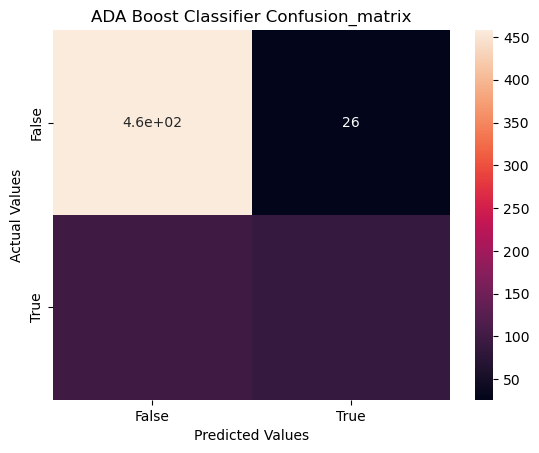

In [214]:
sns.heatmap(cm8, color= 'Purple', annot = True, xticklabels = [False, True], yticklabels = [False, True])
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('ADA Boost Classifier Confusion_matrix')
plt.show()

In [215]:
precision8, recall8, _ = precision_recall_curve(y_test, y_test_ada_pred)

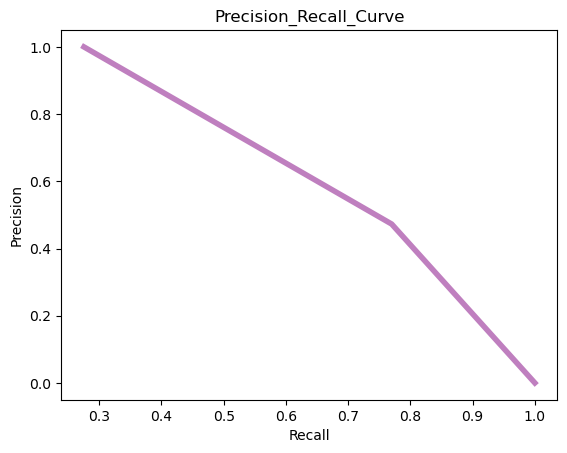

In [216]:
plt.plot(precision8, recall8, lw = 4, color = 'Purple', alpha= 0.5)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision_Recall_Curve')
plt.show()

In [217]:
fpr8, tpr8, threshold8 = roc_curve(y_test, y_test_ada_pred)

In [218]:
auc_roc8 = auc(fpr8, tpr8)

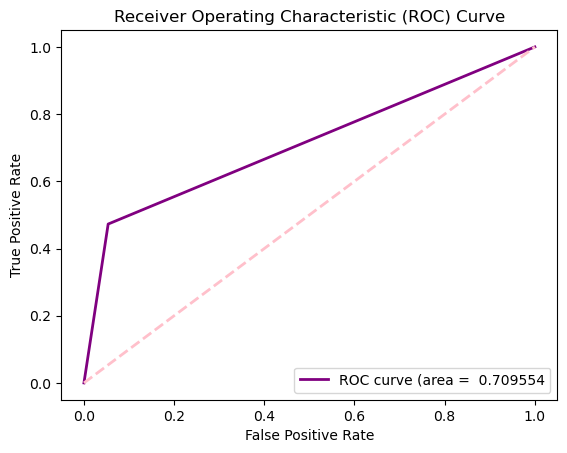

In [219]:
plt.plot(fpr8, tpr8, color = 'Purple', lw = 2, label = f'ROC curve (area = {auc_roc8: 2f}')
plt.plot([0,1],[0,1], color = 'Pink', lw= 2, linestyle = '--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc = 'lower right')
plt.show()

* Plotting a bar chart of important features according to their importance

In [229]:
# Extracting important features
features = df_ada.feature_importances_
feature_names = x_train.columns

In [230]:
# Sorting important features in descending order
order = np.argsort(features)[::-1]

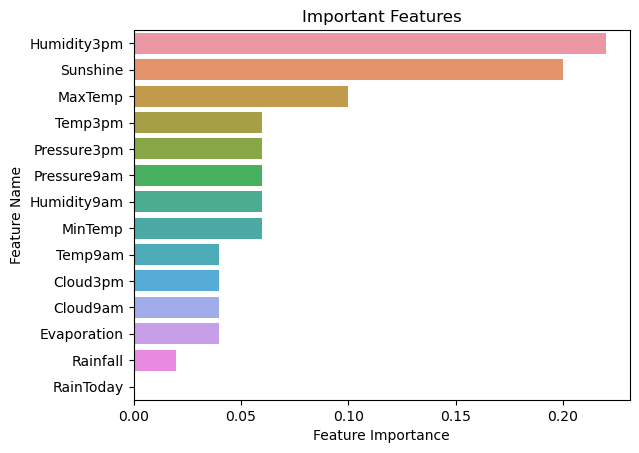

In [234]:
# Plotting the graph
sns.barplot(x = features[order], y= feature_names[order])
plt.title('Important Features')
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')
plt.show()

### XG Boost Classifier with GridSearchCV

In [239]:
# Import required Library
import xgboost as xgb

In [241]:
df_xgb = xgb.XGBClassifier()

In [243]:
params_xgb = {'max_depth': [3,4,5],
             'gamma': [0.1,0.2,0.3],
             'subsample': [0.8, 0.9],
             'colsample_bytree': [0.8, 0.9],
             'n_estimators': [250,500,750]}

In [244]:
df_xgb_gscv = GridSearchCV(df_xgb, params_xgb, cv = 5, n_jobs = -1, scoring = 'accuracy')

In [245]:
df_xgb_gscv.fit(x_train_s, y_train)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.8, 0.9],
                         'gamma': [0.1, 0.2, 0.3], 'max_depth': [3, 4, 5],
                         'n_estimators': [250, 500, 750],
                         'subsample': [0.8, 0.9]},
             scoring='accuracy')

In [246]:
df_xgb_gscv.best_params_

{'colsample_bytree': 0.9,
 'gamma': 0.1,
 'max_depth': 5,
 'n_estimators': 500,
 'subsample': 0.9}

In [248]:
df_xgb_gscv1 = df_xgb_gscv.best_estimator_

In [249]:
df_xgb_gscv1

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=500, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [250]:
df_xgb_gscv1.fit(x_train_s, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=500, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [251]:
y_train_xgb_pred = df_xgb_gscv1.predict(x_train_s)

In [252]:
y_test_xgb_pred = df_xgb_gscv1.predict(x_test_s)

* Evaluating Model Performance

In [262]:
print('confusion_matrix:', confusion_matrix(y_test, y_test_xgb_pred))
print('precision_score:', precision_score(y_test, y_test_xgb_pred))
print('recall_score:', recall_score(y_test, y_test_xgb_pred))
print('accuracy_score:', accuracy_score(y_test, y_test_xgb_pred))
print('roc_auc_score:', roc_auc_score(y_test, y_test_xgb_pred))

confusion_matrix: [[430  54]
 [ 77 107]]
precision_score: 0.6645962732919255
recall_score: 0.5815217391304348
accuracy_score: 0.8038922155688623
roc_auc_score: 0.7349757455982754


In [253]:
# Preparing a XGB Model with best parameters
df_xgb1 = xgb.XGBClassifier(colsample_bytree = 0.9, gamma = 0.1, max_depth = 5, n_estimators = 500, subsample = 0.9)

In [254]:
df_xgb1.fit(x_train_s, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=500, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

* Plotting bar chart of features with thier importance in descending order.
* The given features and thier importance is based on the model prepared with best parameters,

In [255]:
# Extracting best features
features1 = df_xgb1.feature_importances_
feature_names1 = x_train.columns

In [258]:
# Sorting features according to thier importance in descending order
order1 = np.argsort(features1)[::-1]

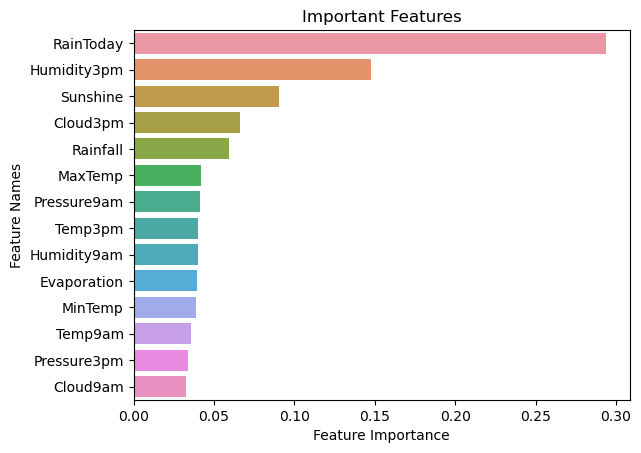

In [261]:
# Plotting the graph
sns.barplot(x = features1[order1], y = feature_names1[order1])
plt.xlabel('Feature Importance')
plt.ylabel('Feature Names')
plt.title('Important Features')
plt.show()

* Plotting confusion_matrix, precision_recall_curve, roc_curve

In [263]:
cm9 = confusion_matrix(y_test, y_test_xgb_pred)

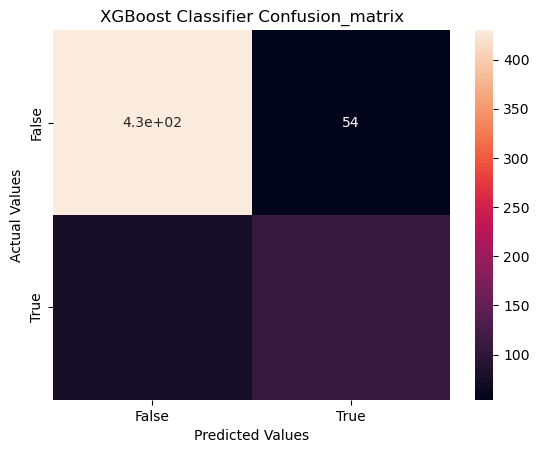

In [264]:
sns.heatmap(cm9, color= 'Purple', annot = True, xticklabels = [False, True], yticklabels = [False, True])
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('XGBoost Classifier Confusion_matrix')
plt.show()

In [265]:
precision9, recall9, _ = precision_recall_curve(y_test, y_test_xgb_pred)

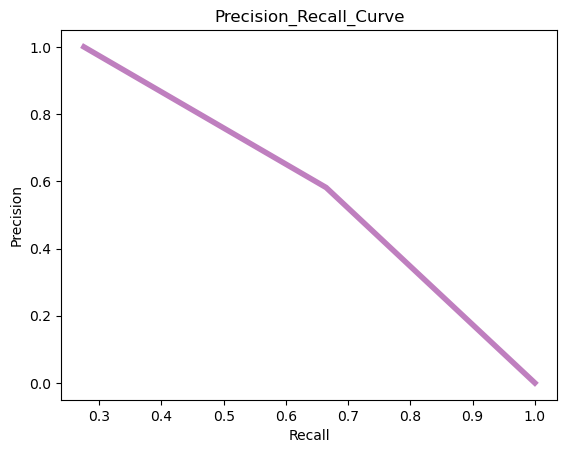

In [266]:
plt.plot(precision9, recall9, lw = 4, color = 'Purple', alpha= 0.5)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision_Recall_Curve')
plt.show()

In [267]:
fpr9, tpr9, threshold9 = roc_curve(y_test, y_test_xgb_pred)

In [268]:
auc_roc9 = auc(fpr9, tpr9)

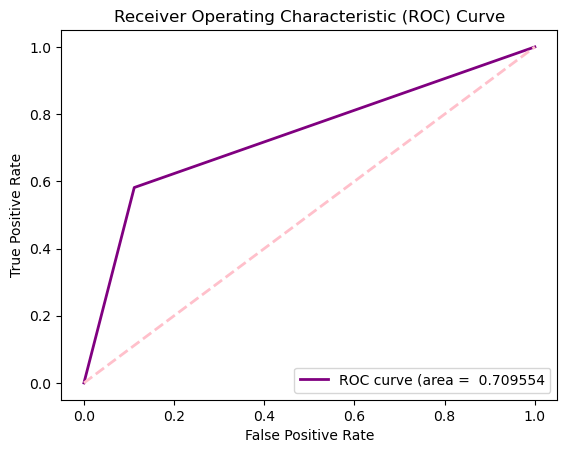

In [269]:
plt.plot(fpr9, tpr9, color = 'Purple', lw = 2, label = f'ROC curve (area = {auc_roc8: 2f}')
plt.plot([0,1],[0,1], color = 'Pink', lw= 2, linestyle = '--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc = 'lower right')
plt.show()

### Summary of evaluation parameters of prepared models

#### Logistic Regression
* confusion_matrix: [[453  31]
 [ 87  97]]
* precision_score: 0.7578125
* recall_score: 0.5271739130434783
* accuracy_score: 0.8233532934131736
* roc_auc_score: 0.7315621631333094
#### Linear Disciminant Model
* confusion_matrix: [[446  38]
 [ 82 102]]
* precision_score: 0.7285714285714285
* recall_score: 0.5543478260869565
* accuracy_score: 0.8203592814371258
* roc_auc_score: 0.7379177146963709
####  K-Nearest Neighbors
* confusion_matrix: [[443  41]
 [ 90  94]]
* precision_score: 0.6962962962962963
* recall_score: 0.5108695652173914
* accuracy_score: 0.8038922155688623
* roc_auc_score: 0.7130794107078693
####  Decision Tree Classifier
* confusion_matrix: [[435  49]
 [ 85  99]]
* precision_score: 0.668918918918919
* recall_score: 0.5380434782608695
* accuracy_score: 0.7994011976047904
* roc_auc_score: 0.718401904419691
####  Bagging Classification 
* confusion_matrix: [[482   2]
 [150  34]]
* precision_score: 0.9444444444444444
* recall_score: 0.18478260869565216
* accuracy_score: 0.7724550898203593
* roc_auc_score: 0.5903251886453467
####  Random Forest Classifier
* confusion_matrix: [[461  23]
 [ 94  90]]
* precision_score: 0.7964601769911505
* recall_score: 0.4891304347826087
* accuracy_score: 0.8248502994011976
* roc_auc_score: 0.720804886812792
####  Gradient Boosting
* confusion_matrix: [[449  35]
 [ 82 102]]
* precision_score: 0.7445255474452555
* recall_score: 0.5543478260869565
* accuracy_score: 0.8248502994011976
* roc_auc_score: 0.7410168882500898
####  ADA Boosting Classifier
* confusion_matrix: [[458  26]
 [ 97  87]]
* precision_score: 0.7699115044247787
* recall_score: 0.47282608695652173
* accuracy_score: 0.8158682634730539
* roc_auc_score: 0.7095535393460294
####  XGBoost Classification
* confusion_matrix: [[430  54]
 [ 77 107]]
* precision_score: 0.6645962732919255
* recall_score: 0.5815217391304348
* accuracy_score: 0.8038922155688623
* roc_auc_score: 0.7349757455982754

### Selecting the best possible model and the reason for selecting the same
The primary paramter for the selection of best model is ACCURACY_SCORE. According to this criteria Random Forest Classifier and Gradient Boosting have top performance showing the same accuracy score of 0.8248502994011976. The second parameter for model selection is precision_score. According to this criteria between Random Forest Classifier and Gradient Boosting, Random Forest Classifier model has higher precision_score of 0.7964601769911505
##### Hence, Random Forest Classifier gave the best result for the Rain Prediction Model. 

### Steps that can be taken to improve this selected model’s performance even further.
Steps are-
#### Data preprocessing and data cleaning.
* Perform data cleaning as accurately as possible.
* Treating missing values and outliers in the data so as to get best possible results.
* We can analyze the correlation matrix and from there we can identify the independent variable which have negligible or no influence on dependent variable which will reduce the noice in the fitting of model.
#### Tuning Hyperparameters
* We can improve the efficieny of Random Forest Technique by adding further specific features like criterion, max_depth, min_samples_split, min_samples_leaf, min_weight_fraction_leaf, max_features, max_leaf_nodes etc to tune it furthermore.